<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Import-Chemical-Data" data-toc-modified-id="Import-Chemical-Data-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Import Chemical Data</a></span></li><li><span><a href="#EGO-utilities" data-toc-modified-id="EGO-utilities-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>EGO utilities</a></span></li><li><span><a href="#Examples" data-toc-modified-id="Examples-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Examples</a></span></li></ul></div>

# EGO decompositions

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import networkx as nx
import toolz as tz
from eden.util import configure_logging
import logging
logger = logging.getLogger()
configure_logging(logger, verbosity=1)
import matplotlib.pyplot as plt
from IPython.core.display import HTML
HTML('<style>.container { width:95% !important; }</style><style>.output_png {display: table-cell;text-align: center;vertical-align: middle;}</style>')

## Import Chemical Data

In [2]:
from toolz import curry, pipe
from eden_chem.io.pubchem import download
from eden_chem.io.rdkitutils import sdf_to_nx

download_active = curry(download)(active=True)
download_inactive = curry(download)(active=False)

def get_pos_graphs(assay_id): return pipe(assay_id, download_active, sdf_to_nx, list)
def get_neg_graphs(assay_id): return pipe(assay_id, download_inactive, sdf_to_nx, list)

from constrActive.utils import pre_process, _random_sample
from eden_chem.io.pubchem import get_assay_description

def make_data(assay_id, max_size=20):
    logger.debug('_'*80)
    logger.debug('Dataset %s info:'%assay_id)
    desc = get_assay_description(assay_id)
    logging.debug('\n%s'%desc)
    # extract pos and neg graphs
    all_pos_graphs, all_neg_graphs = get_pos_graphs(assay_id), get_neg_graphs(assay_id)
    # remove too large and too small graphs and outliers
    initial_max_size=2000
    initial_max_size=max(initial_max_size,max_size)
    args=dict(initial_max_size=initial_max_size, fraction_to_remove=.1, n_neighbors_for_outliers=9, remove_similar=False, max_size=max_size)
    logging.debug('\nPositive graphs')
    pos_graphs = pre_process(all_pos_graphs, **args)
    logging.debug('\nNegative graphs')
    neg_graphs = pre_process(all_neg_graphs, **args)
    logger.debug('-'*80)
    return pos_graphs, neg_graphs

## EGO utilities

In [3]:
from ego.vectorize import set_feature_size
from ego.encode import make_encoder
from ego.decompose import concatenate, compose, iterate

from ego.path import decompose_path
from ego.cycle_basis import decompose_cycles_and_non_cycles, decompose_non_cycles, decompose_cycles
from ego.iterated_clique import decompose_iterated_clique
from ego.context import decompose_context
from ego.dilatate import decompose_dilatate
from ego.degree import decompose_degree_and_non_degree, decompose_degree, decompose_non_degree
from ego.paired_neighborhoods import decompose_paired_neighborhoods, decompose_neighborhood
from ego.centrality import decompose_central_and_non_central, decompose_central, decompose_non_central
from ego.size import decompose_node_size, decompose_edge_size 
from ego.clique import decompose_clique_and_non_clique, decompose_clique, decompose_non_clique
from ego.join import decompose_node_join, decompose_edge_join
from ego.pair import decompose_pair
from ego.identity import decompose_identity

from ego.abstract_label import preprocess_abstract_label
from ego.minor_graph import preprocess_minor_degree

In [4]:
from GraphDesign.utils import draw_mols
from collections import defaultdict

def select_unique(codes, fragments):
    already_seen = set()
    unique_codes=[]
    unique_fragments=[]
    code_counts = defaultdict(int)
    for code, fragment in zip(codes, fragments):
        if code not in already_seen:
            unique_codes.append(code)
            unique_fragments.append(fragment)
            already_seen.add(code)
        code_counts[code] += 1
    return unique_codes, unique_fragments, code_counts

from toolz import curry
@curry
def c_show_decomposition_graphs(graphs, decompose_funcs, preprocessors=None, bitmask=None):
    encoding_func = make_encoder(decompose_funcs, preprocessors=preprocessors, bitmask=bitmask, seed=1)
    for g in graphs:
        print('_'*80)
        draw_mols([g])
        codes, fragments = encoding_func(g)
        unique_codes, unique_fragments, code_counts = select_unique(codes, fragments)
        titles = ['%d   #%d'%(id,code_counts[id]) for id in unique_codes]
        #titles = list(map(str, unique_codes))
        print('%d unique components in %d fragments'%(len(unique_codes),len(codes)))
        if unique_fragments:
            draw_mols(unique_fragments, titles, n_graphs_per_line=9)
        else:
            print('No fragments')

## Examples

In [5]:
%%time
assay_id='624249'
configure_logging(logger, verbosity=2)
pos_graphs, neg_graphs = make_data(assay_id, max_size=100)
configure_logging(logger, verbosity=1)

________________________________________________________________________________
Dataset 624249 info:

qHTS screen for small molecules that inhibit ELG1-dependent DNA repair in human embryonic kidney (HEK293T) cells expressing luciferase-tagged ELG1: Hit Confirmation using MMS Stimulated ELG1
Reading from file: PUBCHEM/AID624249_active.sdf
Reading from file: PUBCHEM/AID624249_inactive.sdf

Positive graphs
original size:355
random sample:355
removed disconnected:339
size filter:322
outlier removal:257
random sample:100

Negative graphs
original size:173
random sample:173
removed disconnected:170
size filter:161
outlier removal:134
random sample:100
--------------------------------------------------------------------------------
CPU times: user 13.2 s, sys: 439 ms, total: 13.7 s
Wall time: 13.5 s


In [6]:
feature_size, bitmask = set_feature_size(nbits=14)
show_decomposition_graphs=c_show_decomposition_graphs(bitmask=bitmask)
import random
random.shuffle(pos_graphs)
gs = pos_graphs[:3]

________________________________________________________________________________


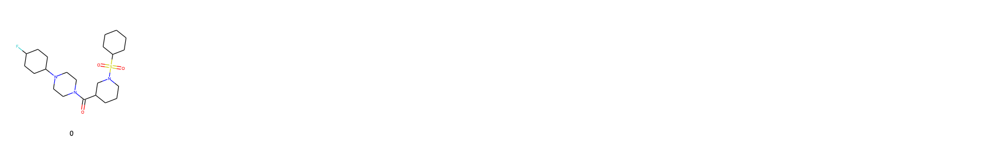

418 unique components in 3010 fragments


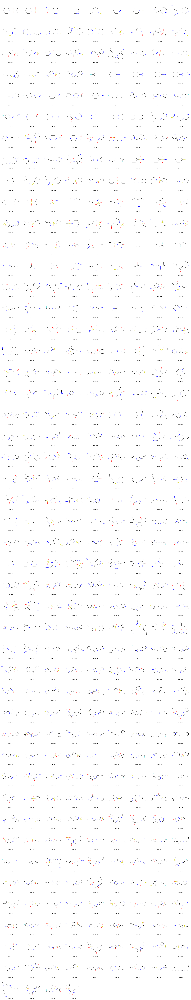

________________________________________________________________________________


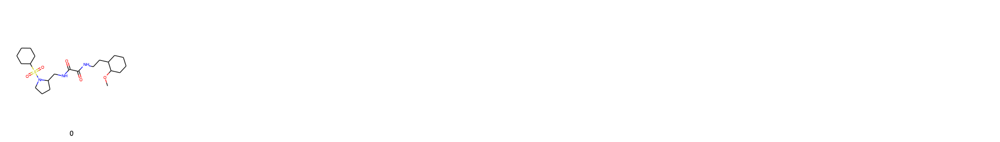

389 unique components in 2372 fragments


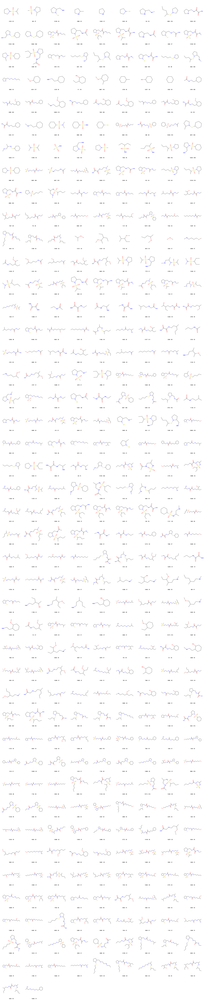

________________________________________________________________________________


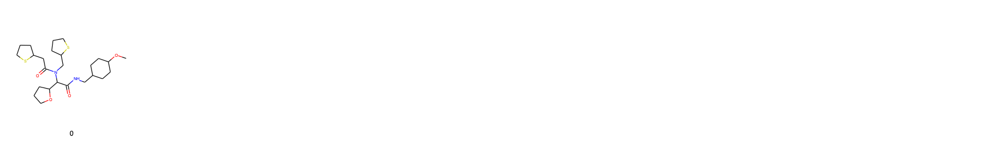

525 unique components in 3482 fragments


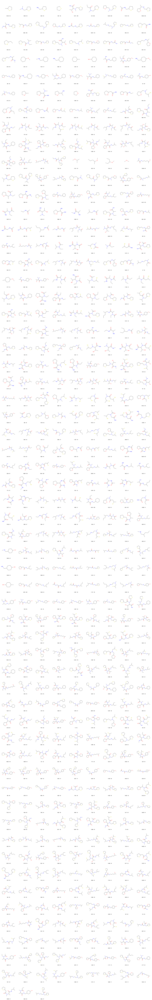

In [10]:
f1 = concatenate(decompose_cycles_and_non_cycles, decompose_neighborhood(radius=2))
f2 = compose(decompose_pair(distance=1), f1)
decompose_func = compose(decompose_edge_join, concatenate(f1,f2))
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


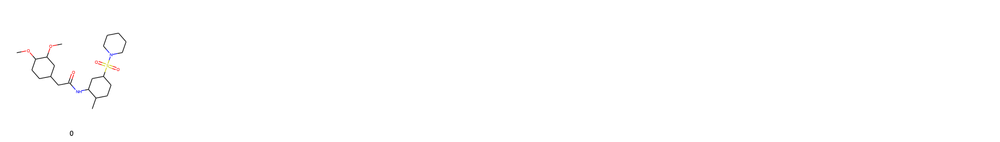

19 unique components in 222 fragments


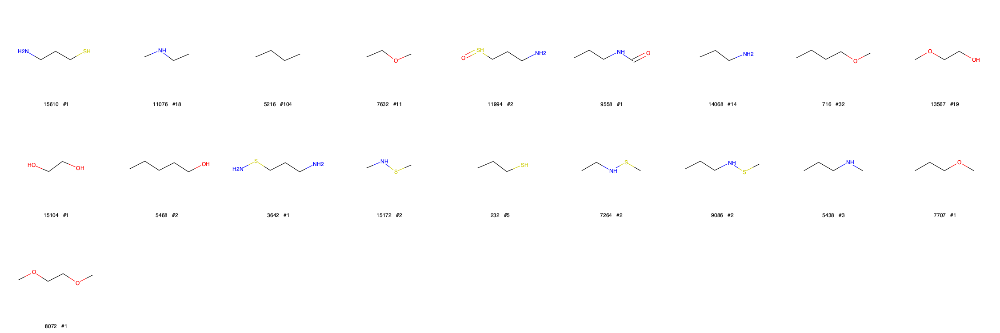

In [7]:
decompose_func = decompose_path(min_len=3, max_len=5)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


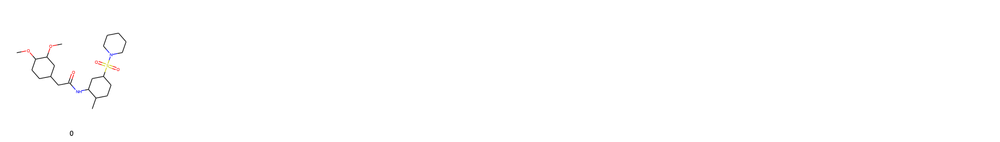

6 unique components in 8 fragments


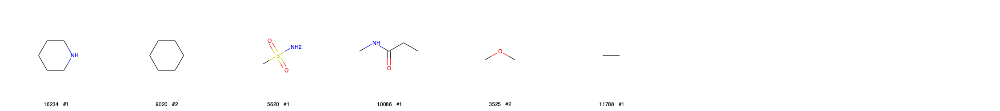

In [8]:
decompose_func = decompose_cycles_and_non_cycles
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


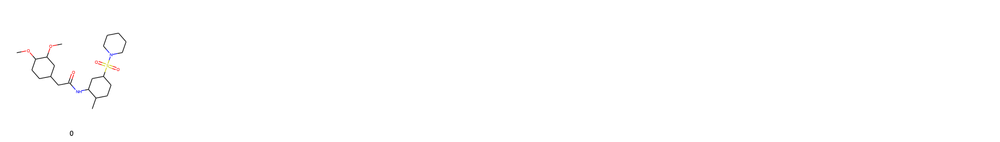

6 unique components in 7 fragments


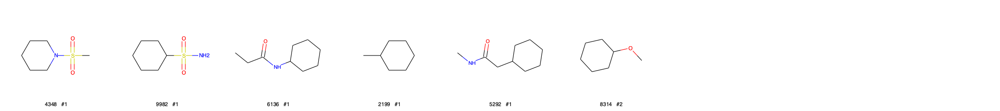

In [9]:
decompose_func = compose(decompose_node_join, decompose_cycles_and_non_cycles)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


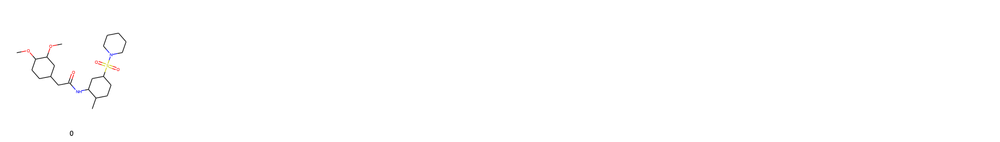

14 unique components in 14 fragments


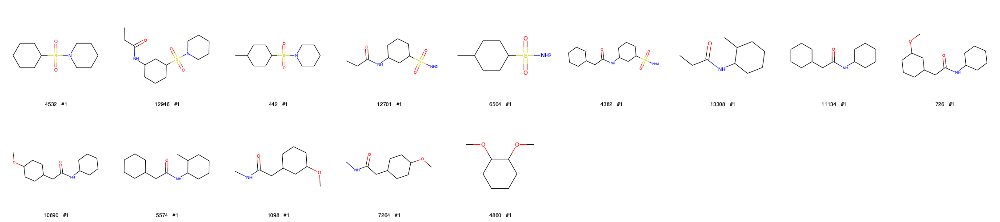

In [10]:
decompose_func = compose(decompose_node_join,decompose_node_join, decompose_cycles_and_non_cycles)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


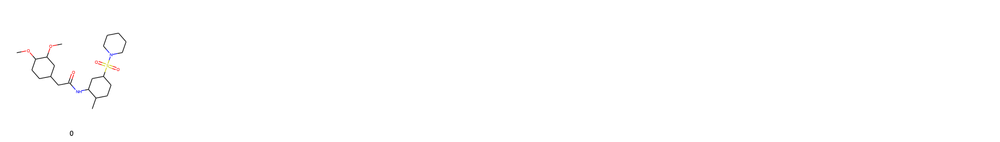

12 unique components in 15 fragments


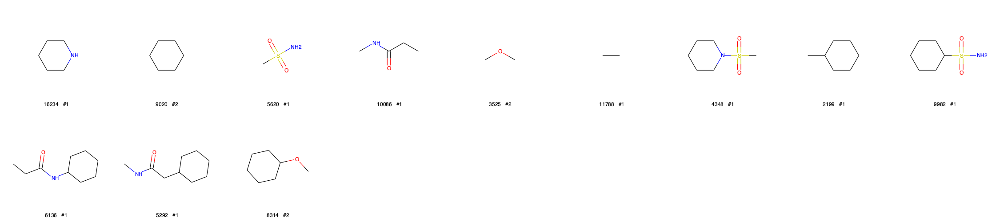

In [11]:
decompose_func = compose(
    decompose_iterated_clique(n_iter=1),
    decompose_cycles_and_non_cycles)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


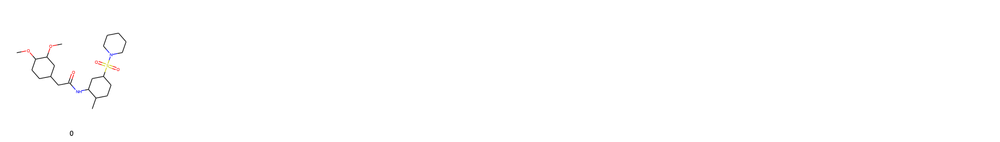

16 unique components in 19 fragments


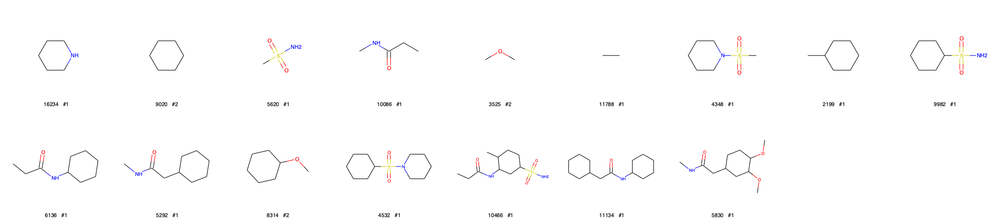

In [12]:
decompose_func = compose(
    decompose_iterated_clique(n_iter=2),
    decompose_cycles_and_non_cycles)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


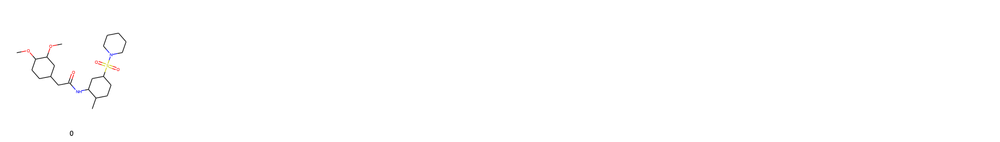

19 unique components in 22 fragments


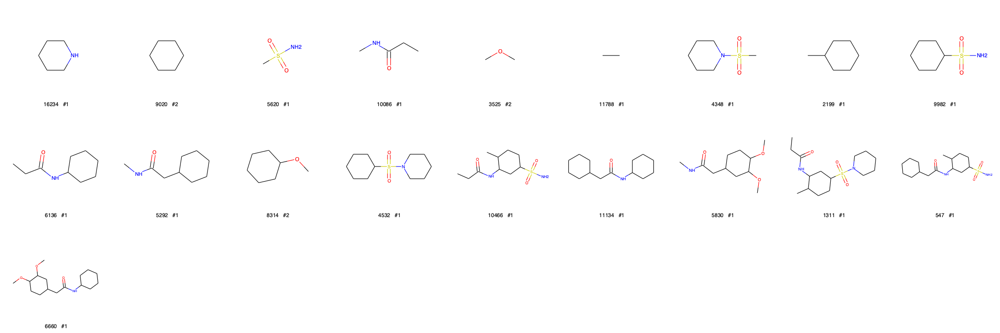

In [13]:
decompose_func = compose(
    decompose_iterated_clique(n_iter=3),
    decompose_cycles_and_non_cycles)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


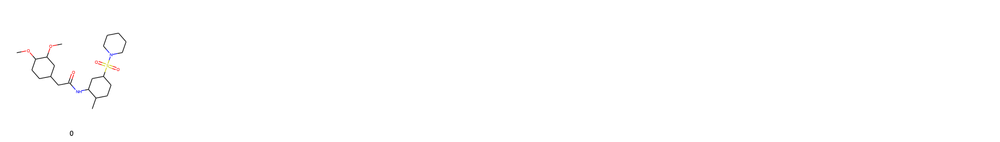

13 unique components in 19 fragments


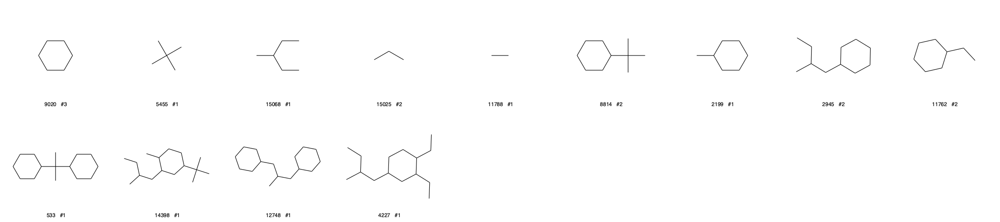

In [14]:
decompose_func = compose(
    decompose_iterated_clique(n_iter=2),
    decompose_cycles_and_non_cycles)
preprocessor = preprocess_abstract_label(node_label='C', edge_label='1')
show_decomposition_graphs(gs, decompose_func, preprocessor)

________________________________________________________________________________


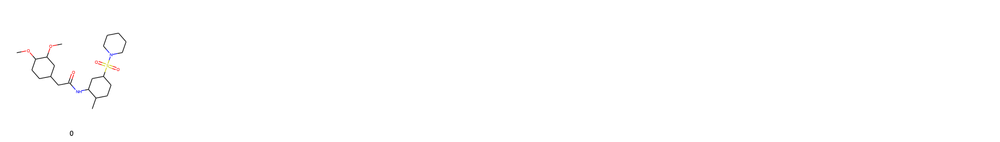

15 unique components in 30 fragments


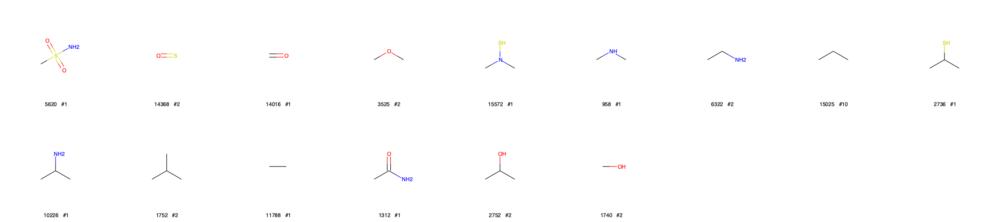

In [15]:
decompose_func = decompose_neighborhood(radius=1)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


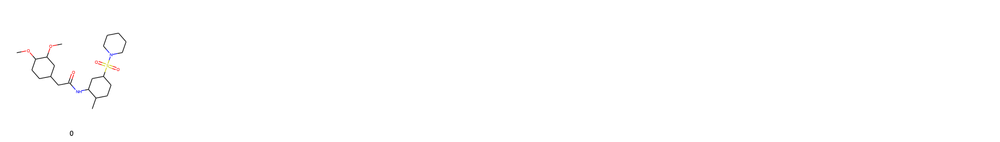

23 unique components in 30 fragments


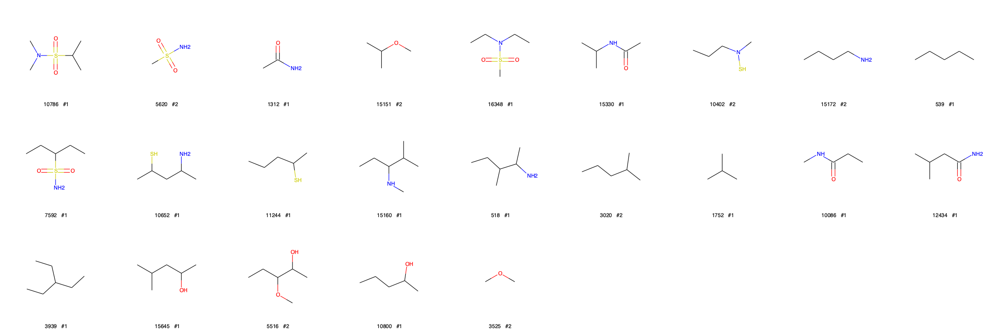

In [16]:
decompose_func = decompose_neighborhood(radius=2)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


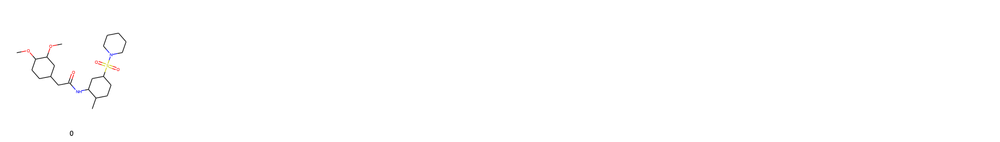

25 unique components in 30 fragments


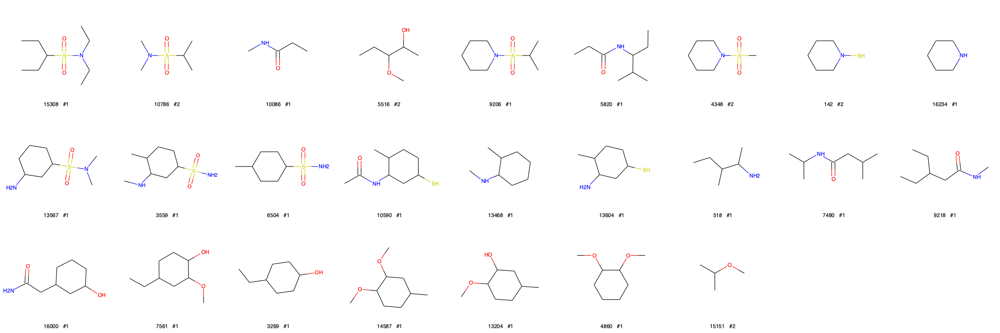

In [17]:
decompose_func = decompose_neighborhood(radius=3)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


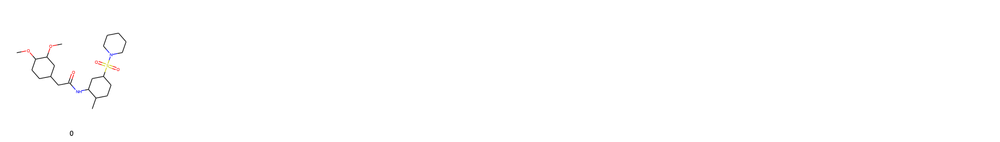

81 unique components in 126 fragments


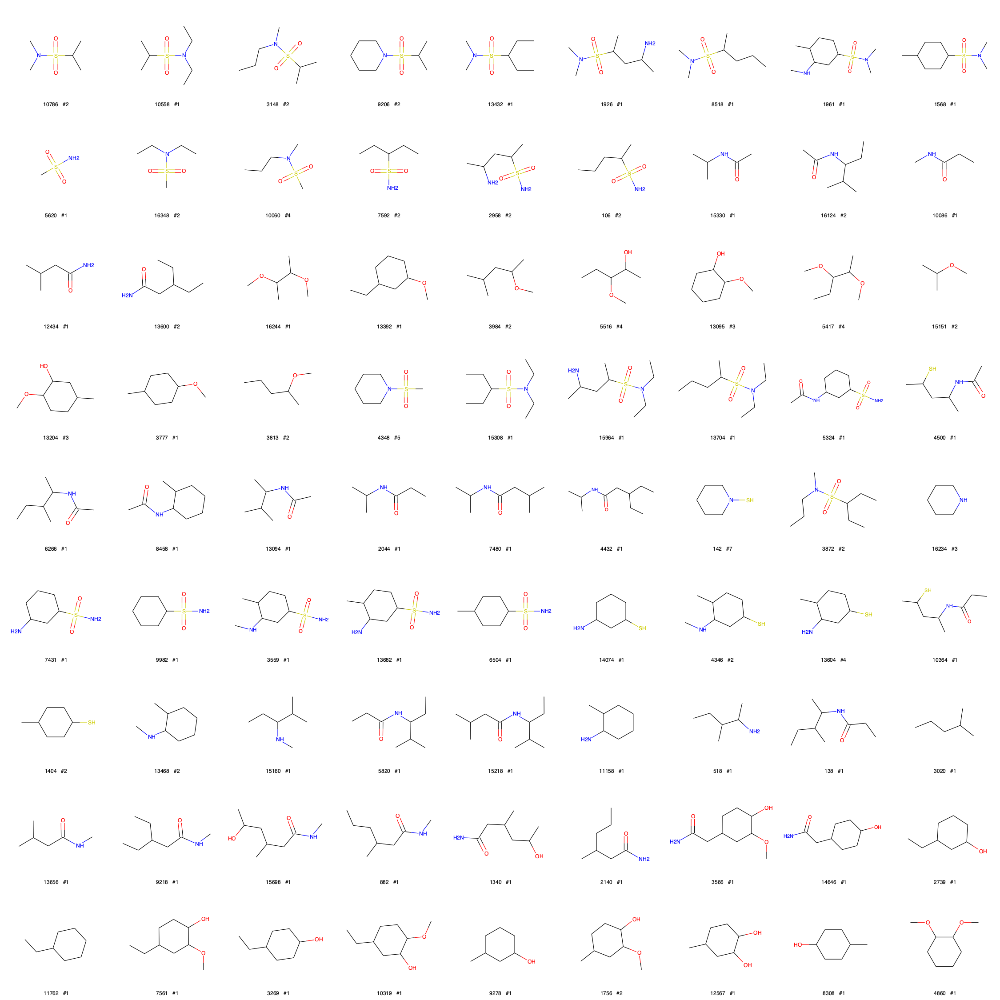

In [18]:
decompose_func = compose(decompose_edge_join, decompose_neighborhood(radius=2))
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


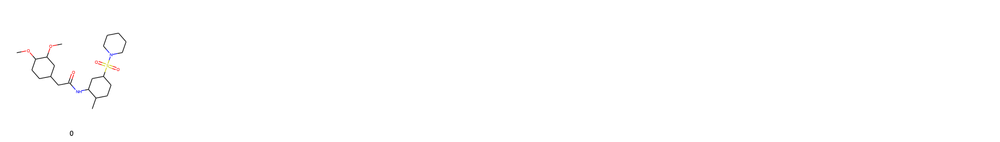

26 unique components in 31 fragments


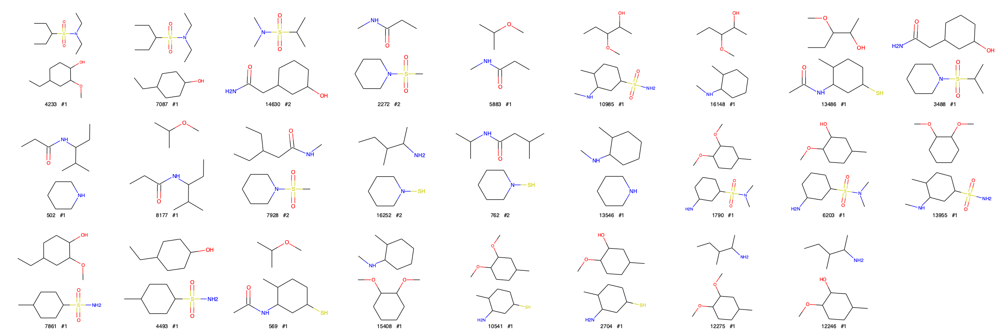

In [19]:
decompose_func = compose(decompose_pair(distance=2), decompose_neighborhood(radius=3))
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


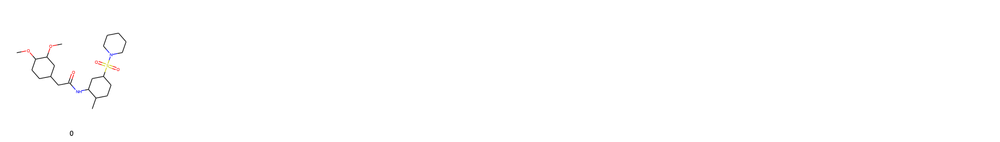

64 unique components in 142 fragments


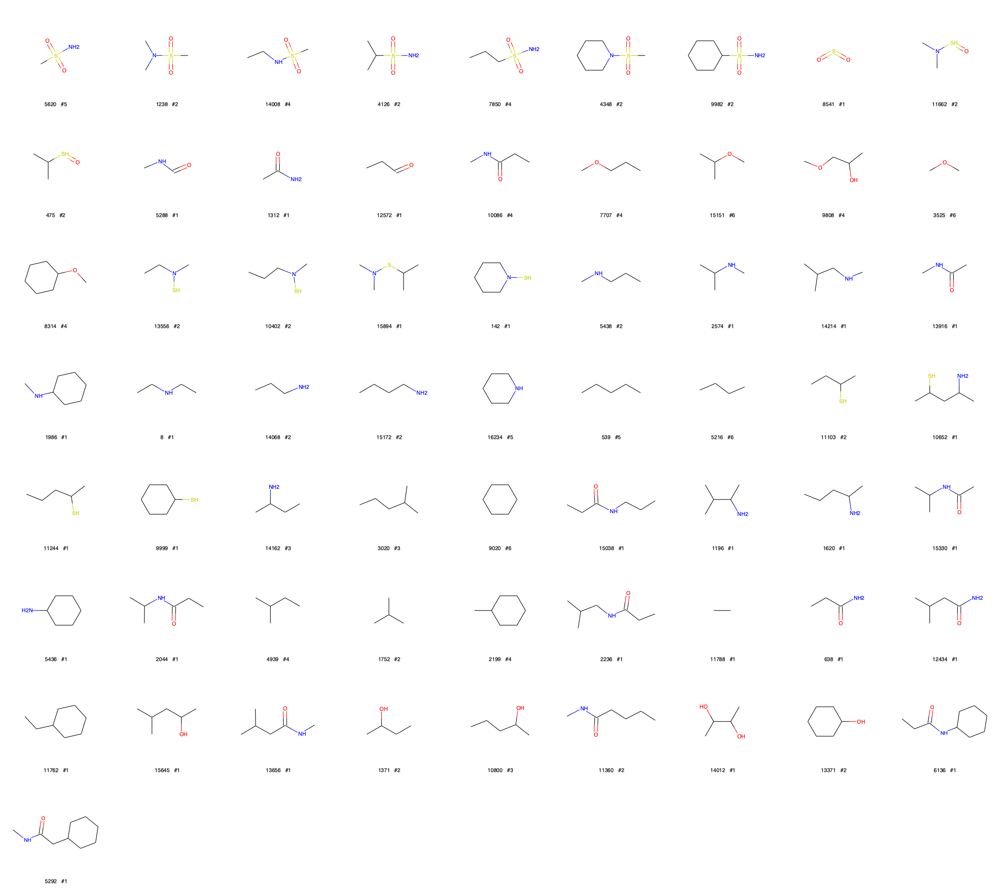

In [20]:
f1 = decompose_neighborhood(radius=1)
f2 = decompose_cycles_and_non_cycles
f3 = concatenate(f1,f2)
decompose_func = compose(decompose_node_join, f3)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


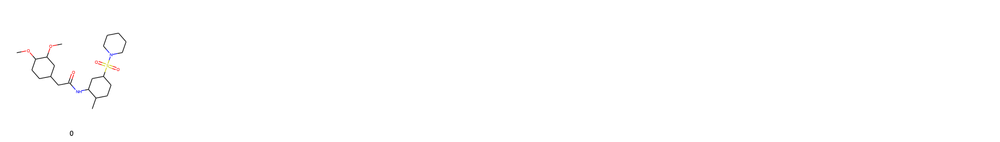

12 unique components in 16 fragments


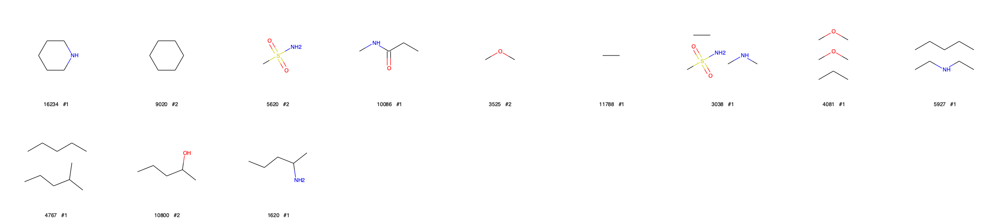

In [21]:
decompose_func = compose(
    decompose_context(radius=2),
    decompose_cycles_and_non_cycles)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


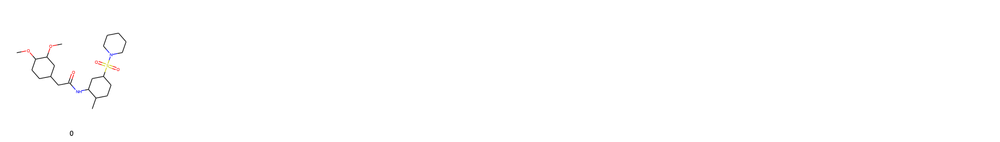

7 unique components in 8 fragments


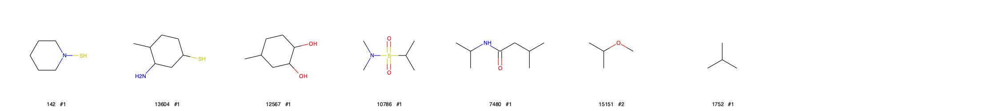

In [22]:
decompose_func = compose(
    decompose_dilatate(radius=1),
    decompose_cycles_and_non_cycles)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


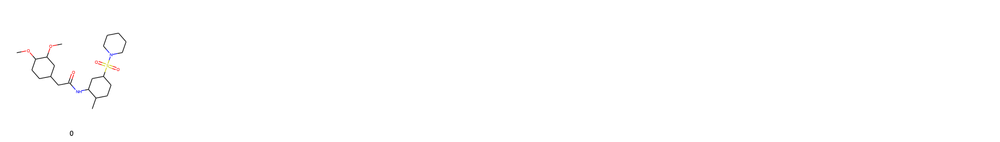

26 unique components in 73 fragments


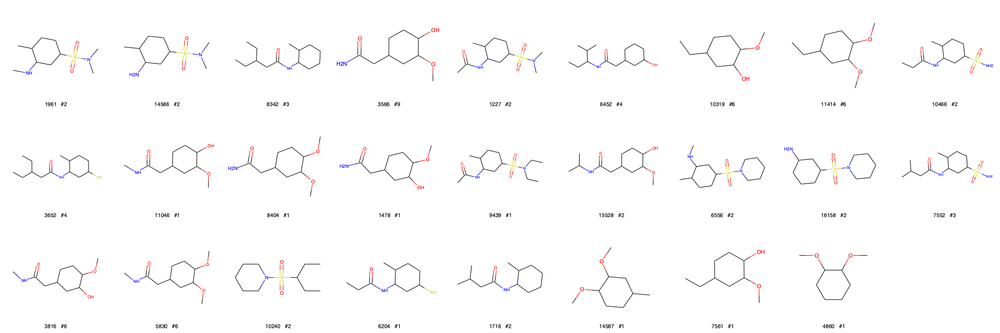

In [23]:
decompose_func = compose(
    decompose_dilatate(radius=2),
    decompose_path(length=5))
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


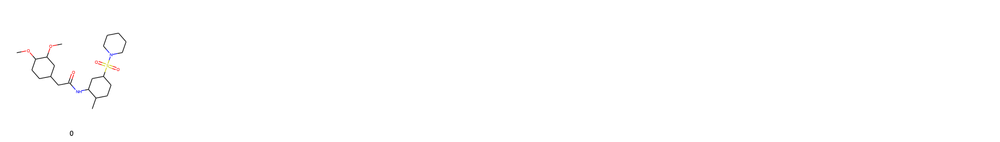

109 unique components in 220 fragments


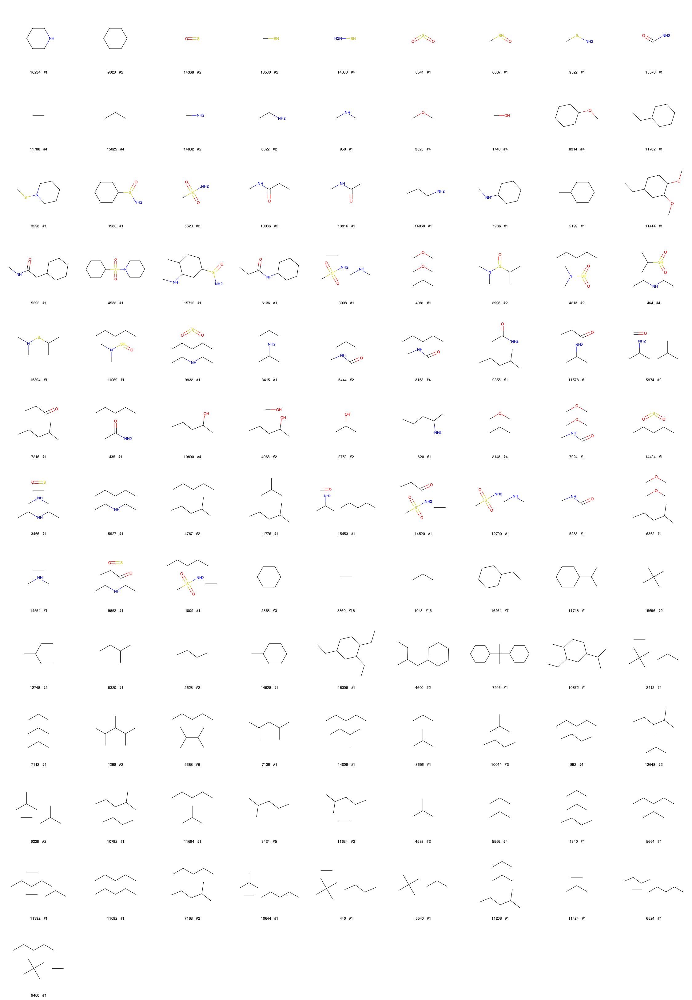

In [24]:
f1 = compose(
    decompose_path(min_len=1, max_len=4), 
    decompose_non_cycles)
f2 = decompose_cycles
f3 = concatenate(f1,f2)
f4 = compose(
    decompose_context(radius=2), 
    decompose_iterated_clique(n_iter=2), 
    f3)

preprocessor1 = preprocess_abstract_label(node_label='C', edge_label='1')

decompose_funcs = [f4, f4]
preprocessors = [None, preprocessor1]
c_show_decomposition_graphs(gs, decompose_funcs, preprocessors=preprocessors, bitmask=bitmask)

________________________________________________________________________________


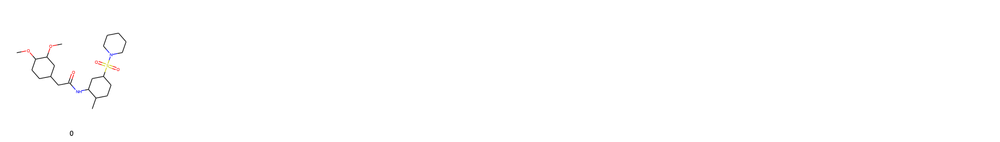

318 unique components in 494 fragments


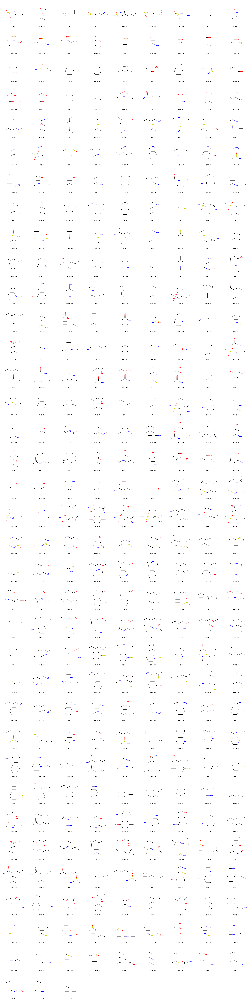

In [25]:
f1 = compose(
    decompose_context(radius=1),
    decompose_neighborhood(radius=1))
f2 = compose(
    decompose_pair(distance=1),
    decompose_neighborhood(radius=1))
f3 = concatenate(f1,f2)
decompose_func = compose(decompose_pair(distance=2), f3)
show_decomposition_graphs(gs, decompose_func)

________________________________________________________________________________


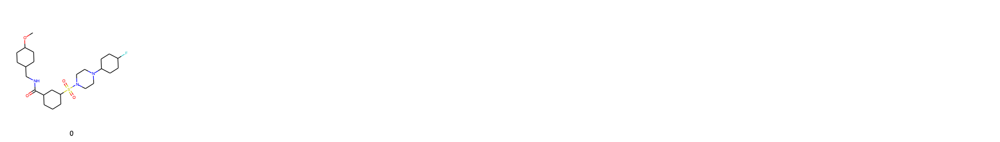

101 unique components in 219 fragments


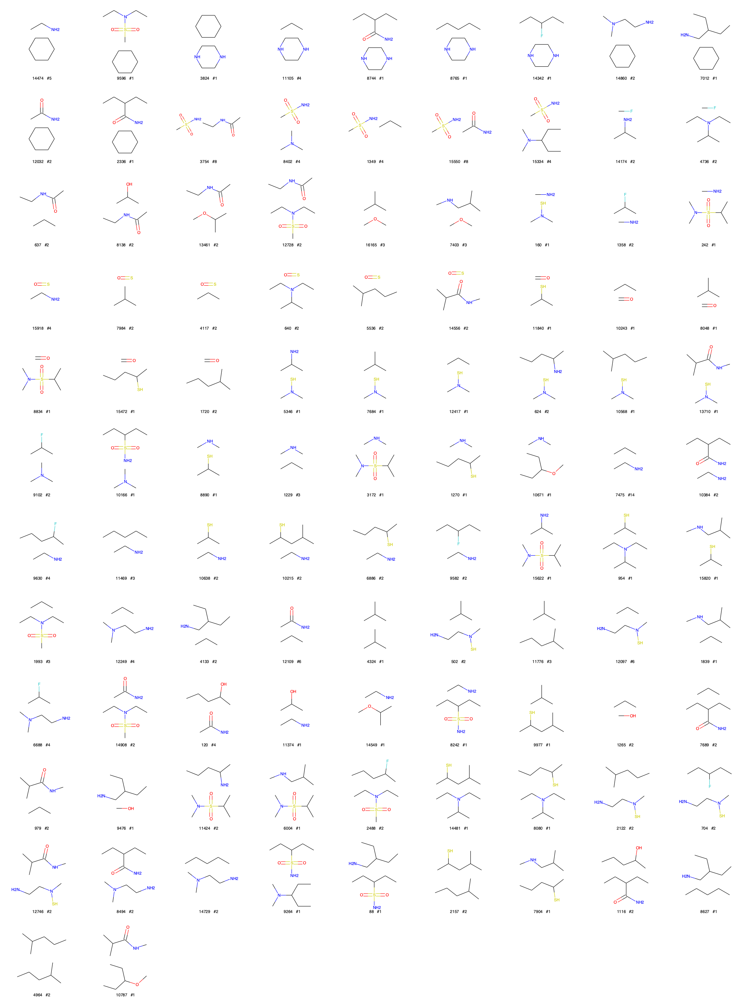

________________________________________________________________________________


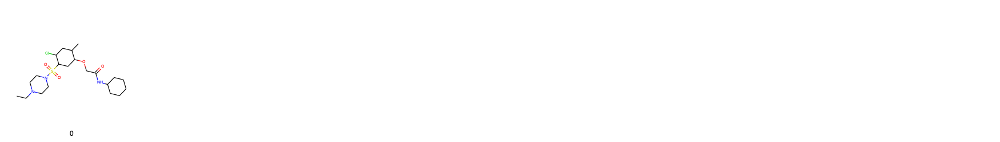

108 unique components in 209 fragments


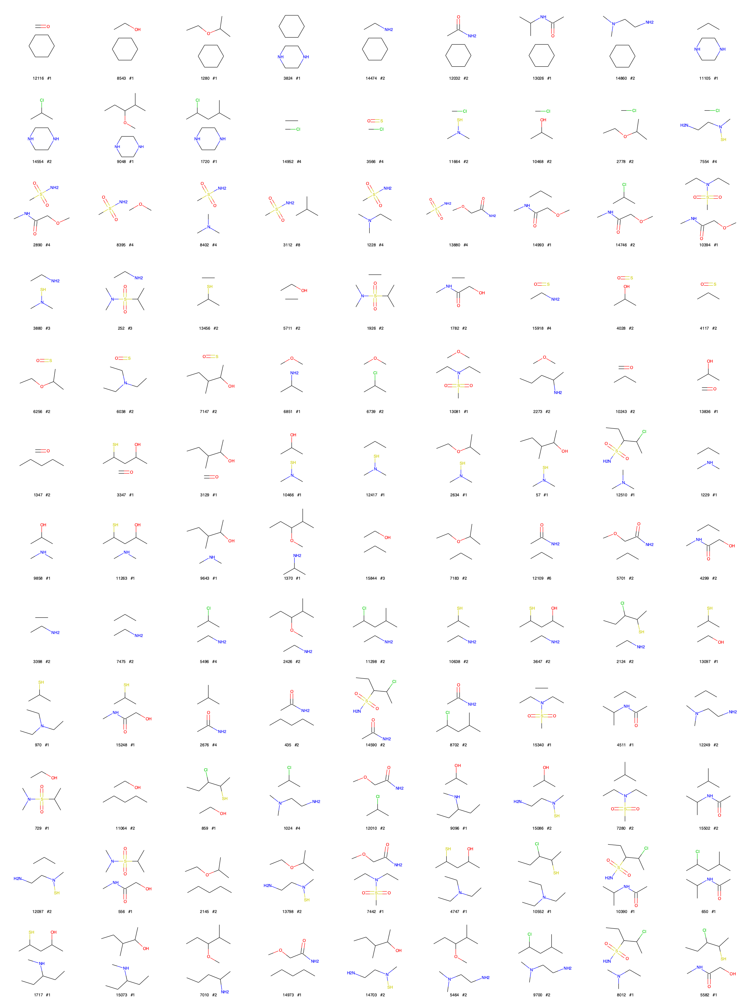

________________________________________________________________________________


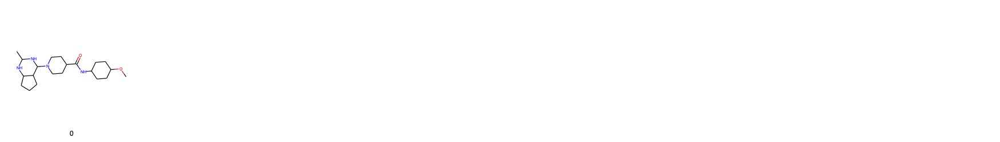

90 unique components in 178 fragments


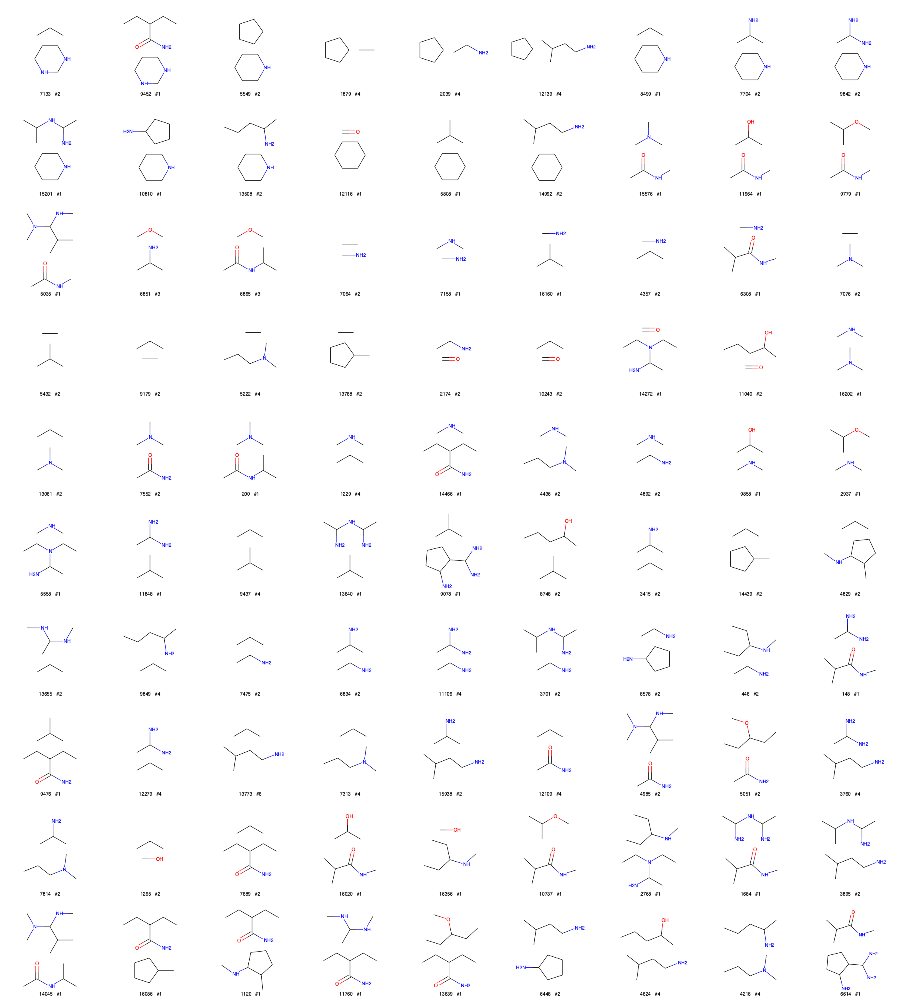

In [12]:
decompose_func = compose(decompose_pair(distance=2),  concatenate(decompose_cycles_and_non_cycles, decompose_neighborhood(radius=1), decompose_neighborhood(radius=2)))
show_decomposition_graphs(gs, decompose_func)

---